<a href="https://colab.research.google.com/github/Rekt77/kisa_insuretech/blob/master/openCV_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import cv2
from google.colab.patches import cv2_imshow

In [0]:
img = cv2.imread('/content/drive/My Drive/insuretech/cv/coffee.jpeg')

In [26]:
#픽셀 별로 BGR 순서로 읽어들임
#넘파이 객체로 읽어들임
print(img)

#1024x1024크기 3채널
print(img.shape)

[[[131 143 145]
  [126 138 140]
  [124 136 138]
  ...
  [193 193 177]
  [186 187 171]
  [176 177 161]]

 [[121 133 135]
  [127 139 141]
  [127 139 141]
  ...
  [193 193 177]
  [190 191 175]
  [184 185 169]]

 [[130 141 145]
  [138 149 153]
  [131 142 146]
  ...
  [193 193 177]
  [192 192 176]
  [190 190 174]]

 ...

 [[ 46  58  64]
  [ 41  53  59]
  [ 44  56  62]
  ...
  [254 251 253]
  [254 251 253]
  [254 251 253]]

 [[ 38  53  56]
  [ 42  57  60]
  [ 42  54  58]
  ...
  [254 251 253]
  [254 251 253]
  [254 251 253]]

 [[ 39  54  57]
  [ 38  53  56]
  [ 39  52  54]
  ...
  [254 251 253]
  [254 251 253]
  [254 251 253]]]
(1024, 1024, 3)


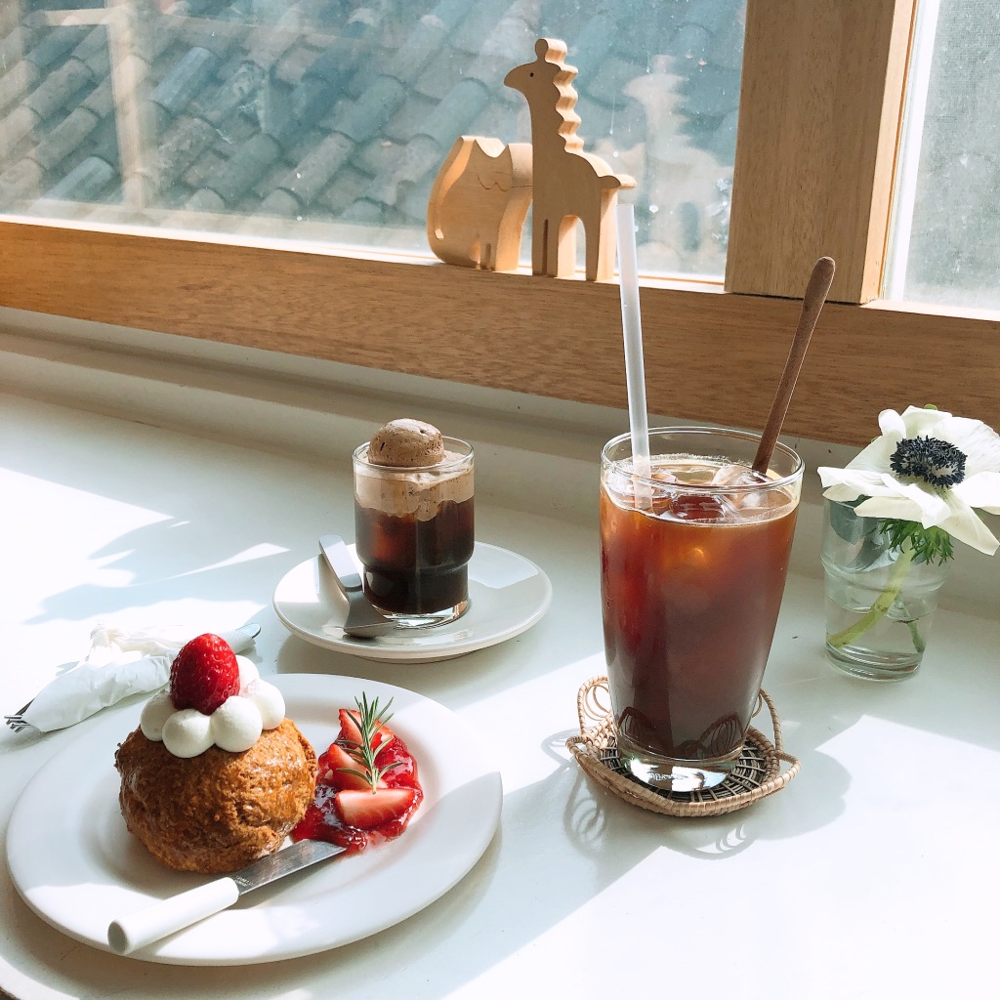

In [27]:
cv2_imshow(img)

(1024, 1024)


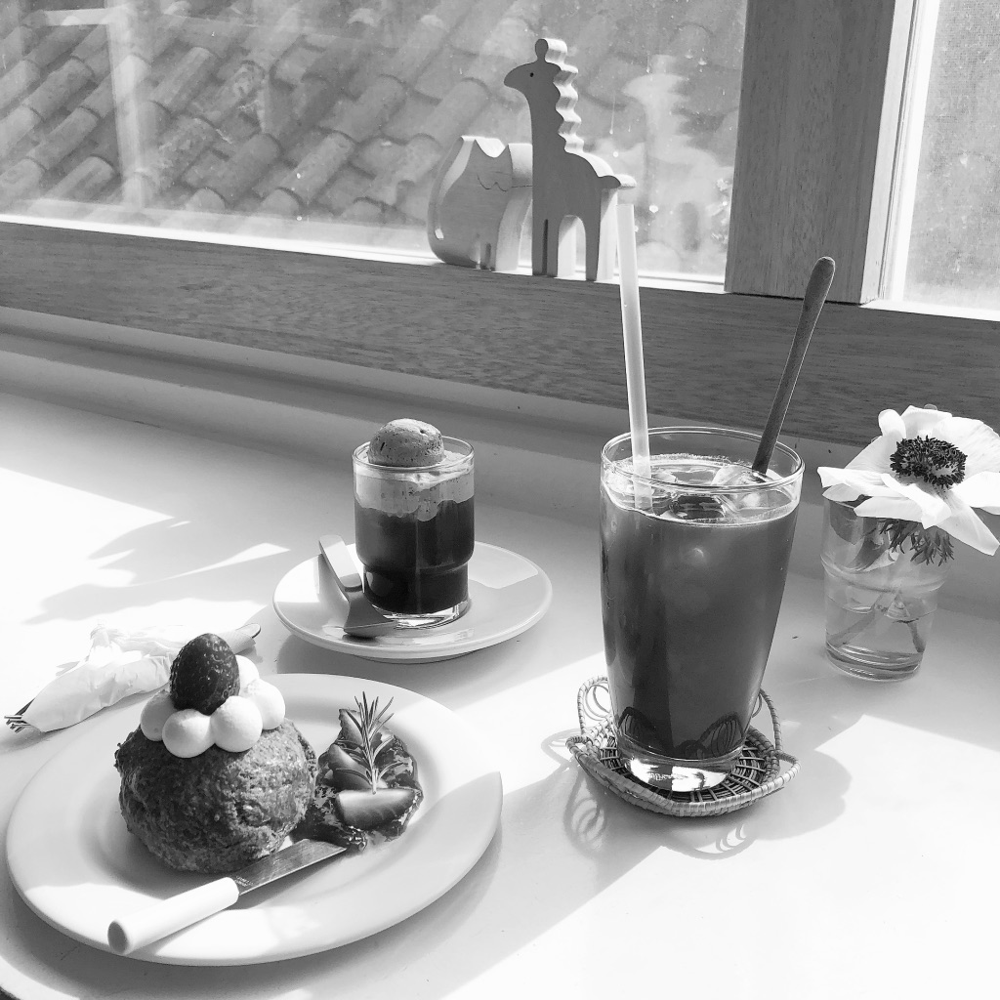

True

In [28]:
#grayscale은 1채널
#cvtColor
#cv2.COLOR_BGR2HSV: 색상, 채도, 명도의 좌표를 써서 특정한 색을 지정한다
img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
print(img_gray.shape)

cv2_imshow(img_gray)

img_fix = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)

# 이미지 결과 저장
cv2.imwrite('/content/drive/My Drive/insuretech/cv/result.jpg',img_fix)

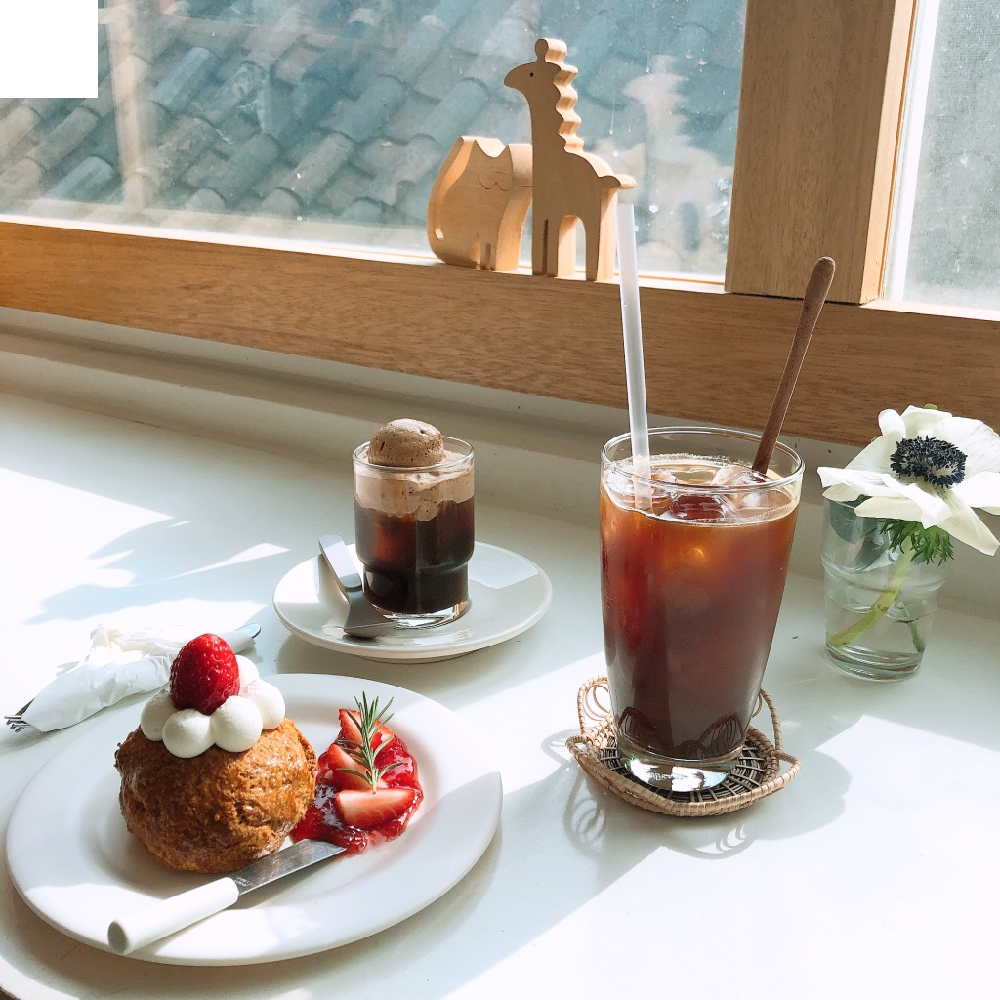

In [29]:
#원하는 부분의 BGR 변경
img[:100,:100] = [255,255,255]
cv2_imshow(img)

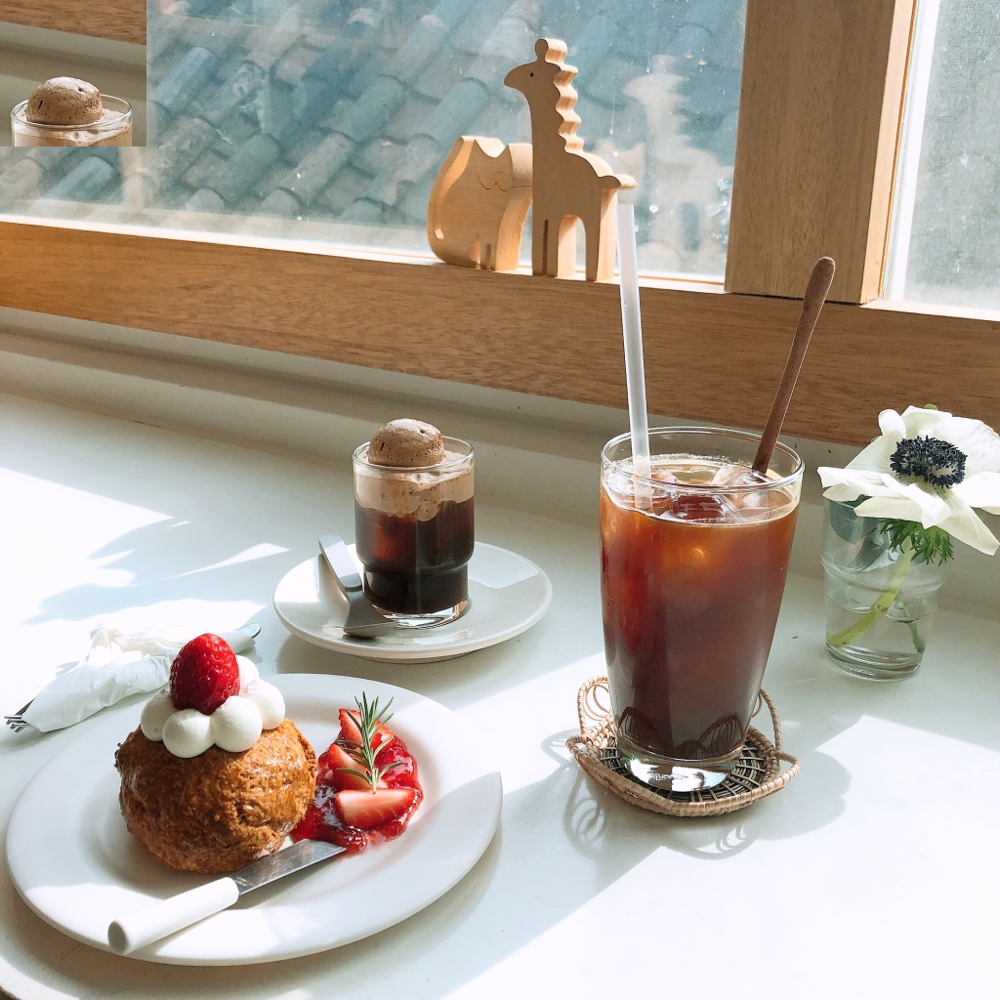

In [30]:
# 원하는 부분 추출
ROI = img[350:500,350:500]

#추출한 부분 이미지에 붙여넣기
img[:150,:150] = ROI

cv2_imshow(img)

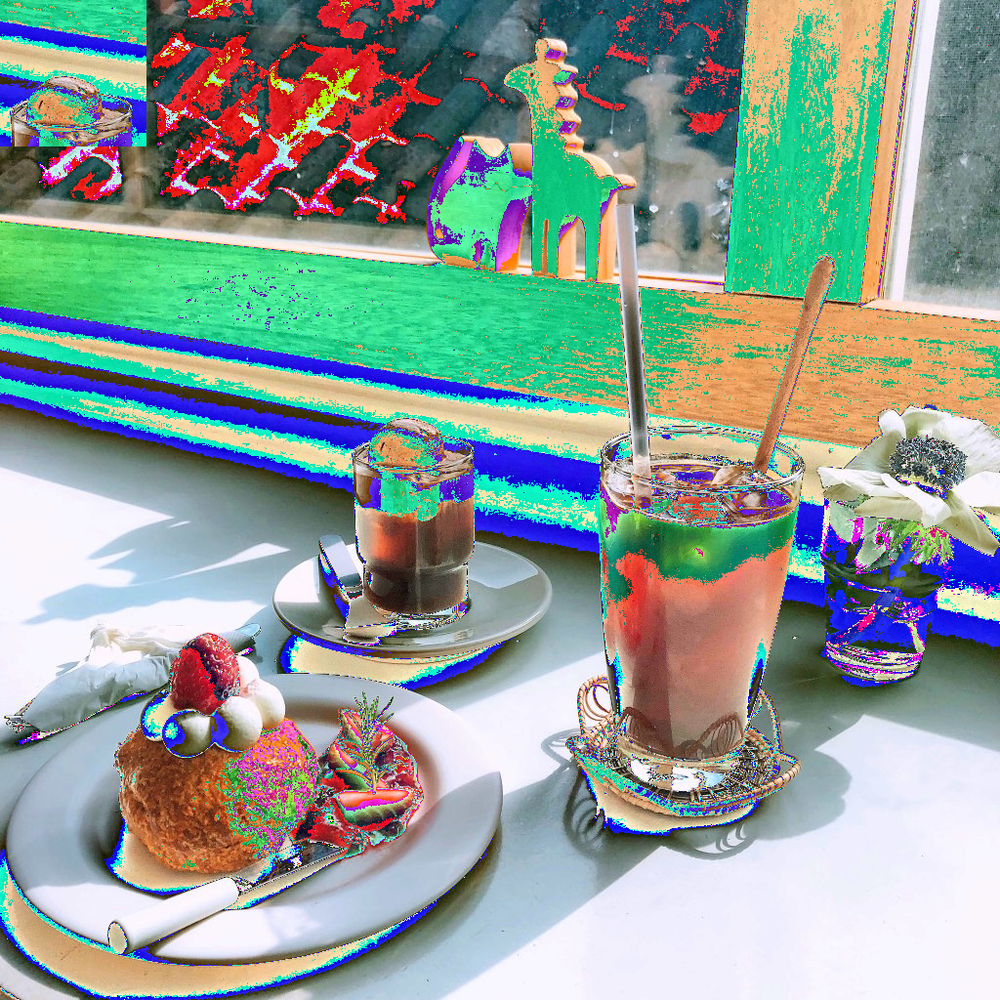

[[[134 206  26]
  [130 200  24]
  [128 198  28]
  ...
  [130 130  98]
  [116 118  86]
  [ 96  98  66]]

 [[124 196  16]
  [132 202  26]
  [134 204  28]
  ...
  [130 130  98]
  [124 126  94]
  [112 114  82]]

 [[124 196  20]
  [120 190  14]
  [120 190  14]
  ...
  [130 130  98]
  [128 128  96]
  [124 124  92]]

 ...

 [[ 92 116 128]
  [ 82 106 118]
  [ 88 112 124]
  ...
  [252 246 250]
  [252 246 250]
  [252 246 250]]

 [[ 76 106 112]
  [ 84 114 120]
  [ 84 108 116]
  ...
  [252 246 250]
  [252 246 250]
  [252 246 250]]

 [[ 78 108 114]
  [ 76 106 112]
  [ 78 104 108]
  ...
  [252 246 250]
  [252 246 250]
  [252 246 250]]]


In [31]:
cv2_imshow(img*2)

#값이 넘어간것은 알아서 처리해줌
print(img*2)

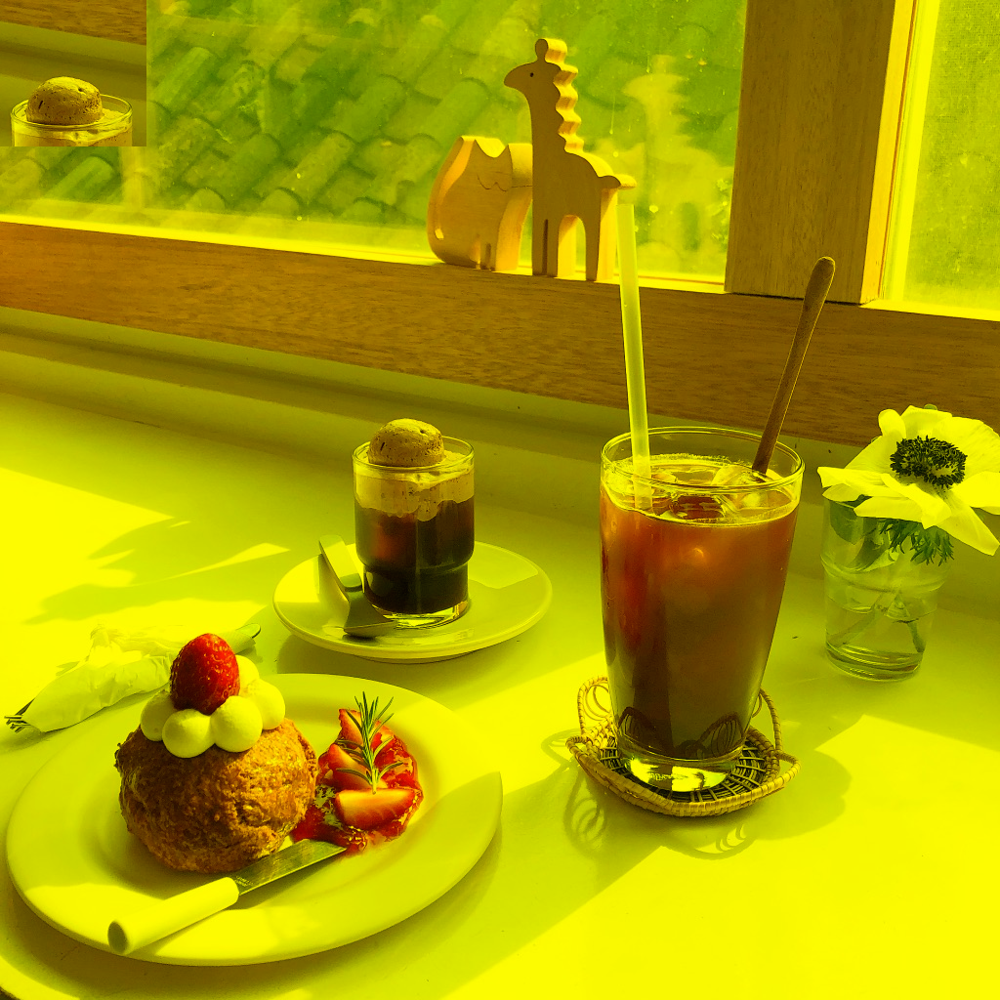

In [33]:
img[:,:,0]=1
cv2_imshow(img)

(410, 410, 3)


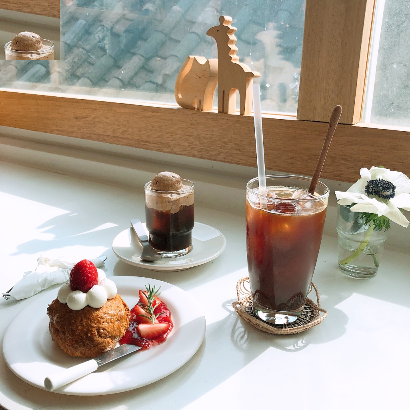

In [32]:
# resize
# fx = 변경 width 비율
# fy = 변경 height 비율
# interpolation = 보간법

resized = cv2.resize(img,dsize=None,fx=0.4,fy=0.4,interpolation=cv2.INTER_CUBIC)
print(resized.shape)
cv2_imshow(resized)

(410, 410, 3)


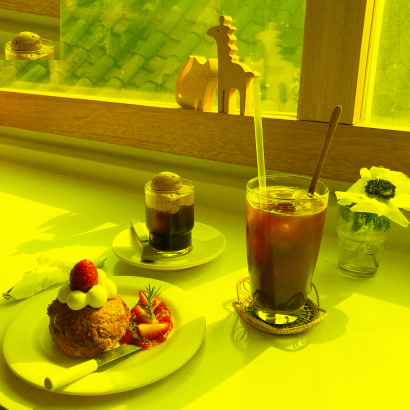

In [34]:
resized = cv2.resize(img,dsize=None,fx=0.4,fy=0.4,interpolation=cv2.INTER_AREA)
print(resized.shape)
cv2_imshow(resized)

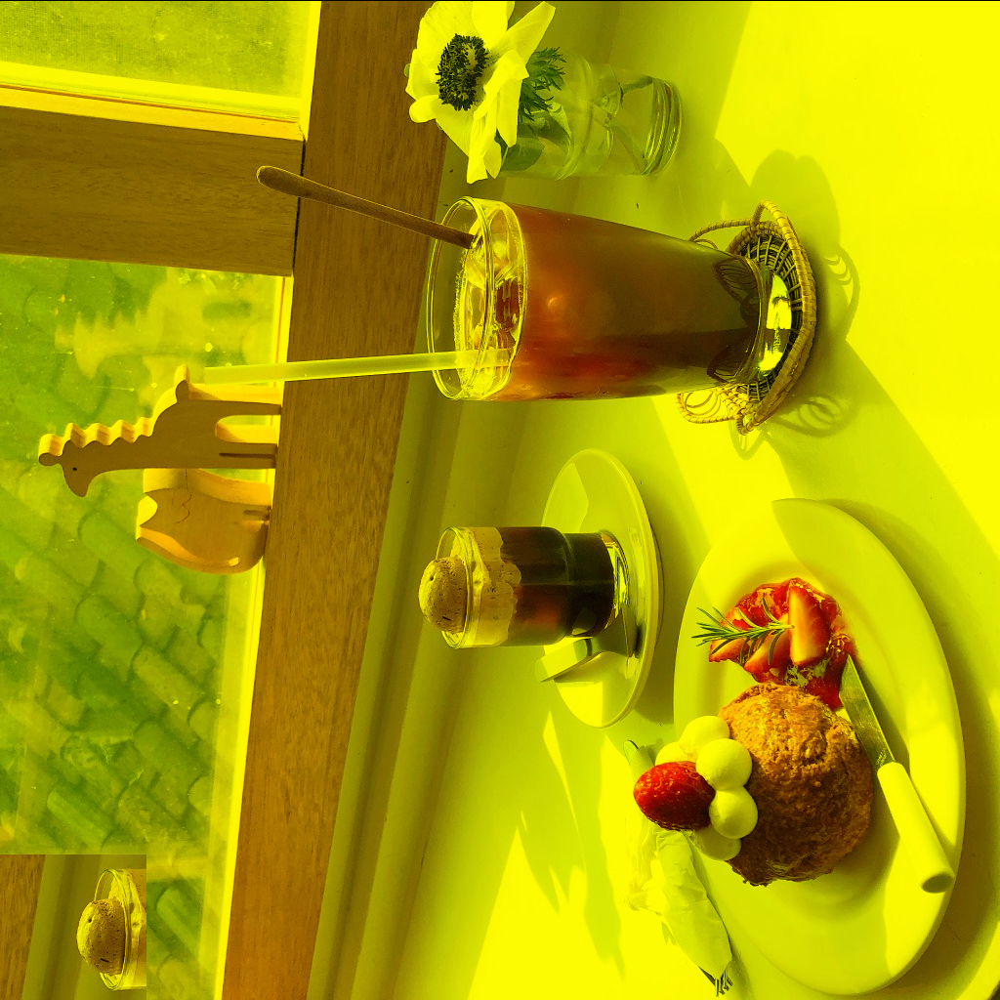

In [35]:
# 이미지 회전
# center: 회전 중심축
# angle: 각도
# scale: 크기
rot = cv2.getRotationMatrix2D(center=(img.shape[0]/2,img.shape[1]/2),angle=90,scale=1)
res = cv2.warpAffine(img,rot,(img.shape[0],img.shape[1]))
cv2_imshow(res)

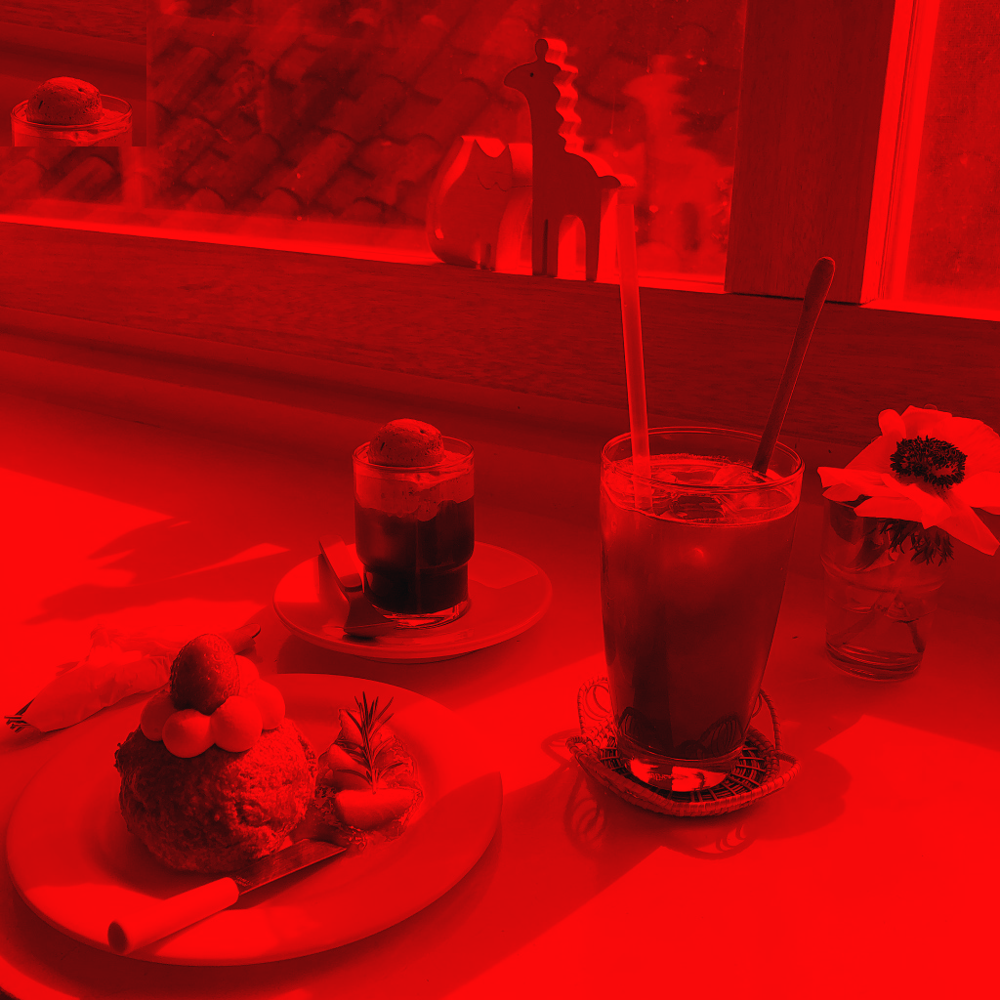

In [38]:
# img객체는 numpy array이기 때문에 서로 합치기가 가능함
img_fix = img[:,:,1] = 10
col = cv2.add(img,img_fix)
cv2_imshow(col)

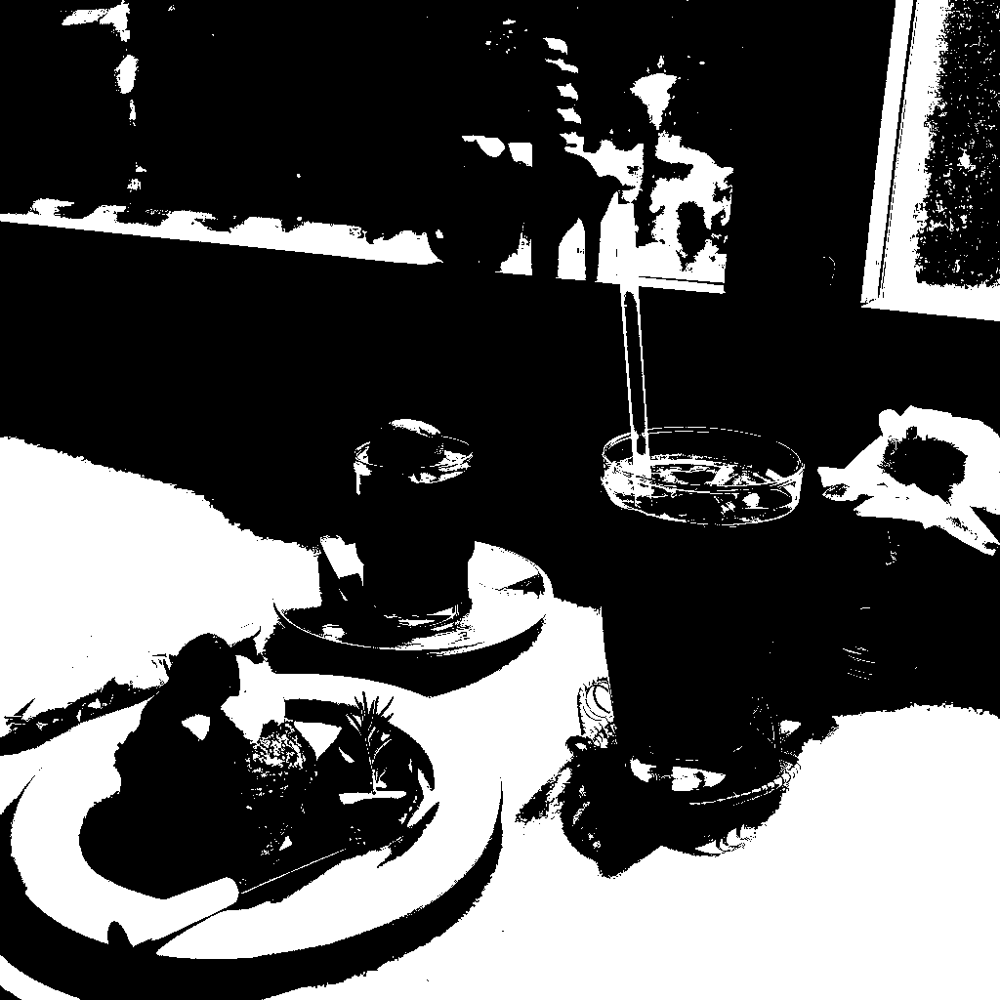

In [41]:
# image 임계값처리
# grayscale은 픽셀당 0~255 사이의 값을 가짐
# 특정 값(임계값) 이상인 값들을 임의의 값으로 대체
# 이미지를 0과 255두개의 수로만 나타내는 방법
# 이 함수에서는 200이 임계값
_, thresh = cv2.threshold(img_gray,200,255,cv2.THRESH_BINARY)
cv2_imshow(thresh)

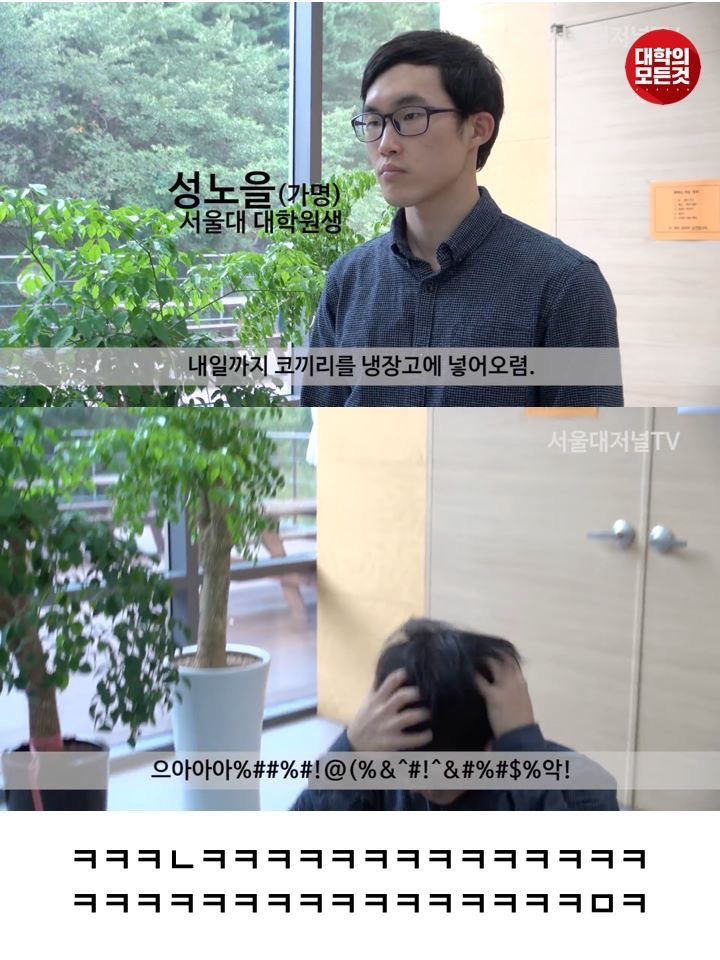

rectangles[[(328, 79) (452, 203)]]


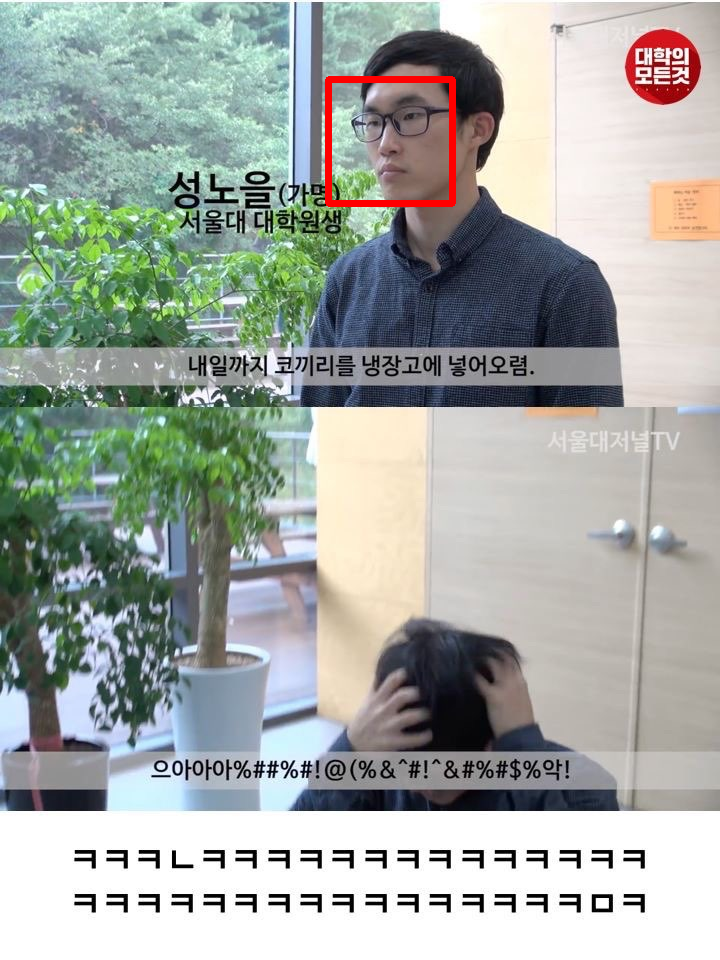

In [42]:
import dlib

img = cv2.imread('/content/drive/My Drive/insuretech/cv/school.jpeg')
cv2_imshow(img)

#face detector 인스턴스
detector = dlib.get_frontal_face_detector()

# dlib의 detector객체 선언 후 이미지 대입
faces = detector(img)
print(faces)

x1,y1,x2,y2 = faces[0].left(),faces[0].top(),faces[0].right(),faces[0].bottom()
cv2.rectangle(img,(x1,y1),(x2,y2),(0,0,255),5)
cv2_imshow(img)

rectangles[[(328, 79) (452, 203)]]


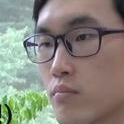

In [43]:
img = cv2.imread('/content/drive/My Drive/insuretech/cv/school.jpeg')
detector = dlib.get_frontal_face_detector()

# dlib의 detector객체 선언 후 이미지 대입
faces = detector(img)
print(faces)

x1,y1,x2,y2 = faces[0].left(),faces[0].top(),faces[0].right(),faces[0].bottom()
cv2_imshow(img[y1:y2,x1:x2])